<class 'pandas.core.frame.DataFrame'>
RangeIndex: 55122 entries, 0 to 55121
Data columns (total 10 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   ATM_ID              55122 non-null  object
 1   Date                55122 non-null  object
 2   Day                 55122 non-null  object
 3   Time                55122 non-null  object
 4   Transaction_Type    55122 non-null  object
 5   Transaction_Amount  55122 non-null  int64 
 6   Remaining_Cash      55122 non-null  int64 
 7   Cash_Refill         30348 non-null  object
 8   Transaction_Status  55122 non-null  object
 9   Festival            4913 non-null   object
dtypes: int64(2), object(8)
memory usage: 4.2+ MB
None
    ATM_ID        Date     Day      Time Transaction_Type  Transaction_Amount  \
0  ATM_013  2024-01-01  Monday  03:15:08       Withdrawal               10100   
1  ATM_013  2024-01-01  Monday  06:07:27          Inquiry                   0   
2  ATM_013  2024-

c:\Users\vibhu\miniconda3\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


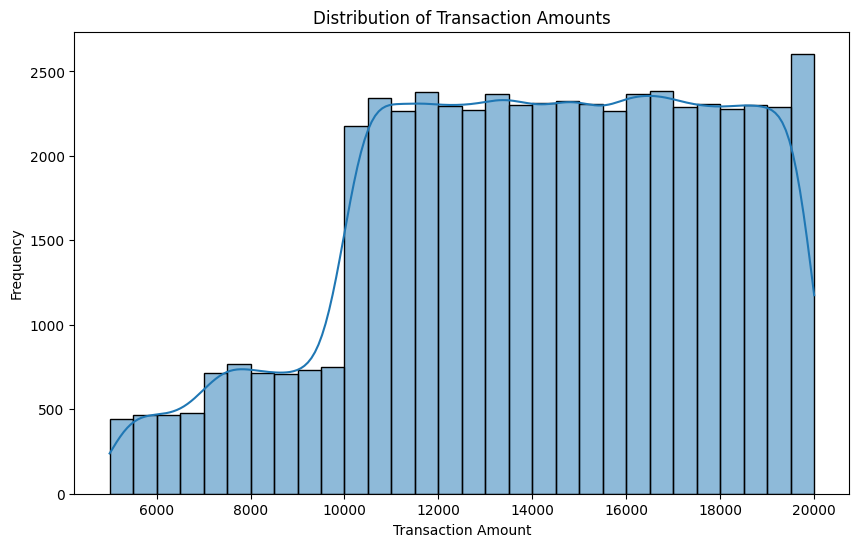

c:\Users\vibhu\miniconda3\lib\site-packages\_plotly_utils\basevalidators.py:106: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



        Date day_of_week  month  quarter  year
0 2024-01-01      Monday      1        1  2024
2 2024-01-01      Monday      1        1  2024
3 2024-01-01      Monday      1        1  2024
4 2024-01-01      Monday      1        1  2024
5 2024-01-01      Monday      1        1  2024
        Date  is_salary_day
0 2024-01-01              1
2 2024-01-01              1
3 2024-01-01              1
4 2024-01-01              1
5 2024-01-01              1
        Date  is_salary_day  is_festival
0 2024-01-01              1            0
2 2024-01-01              1            0
3 2024-01-01              1            0
4 2024-01-01              1            0
5 2024-01-01              1            0


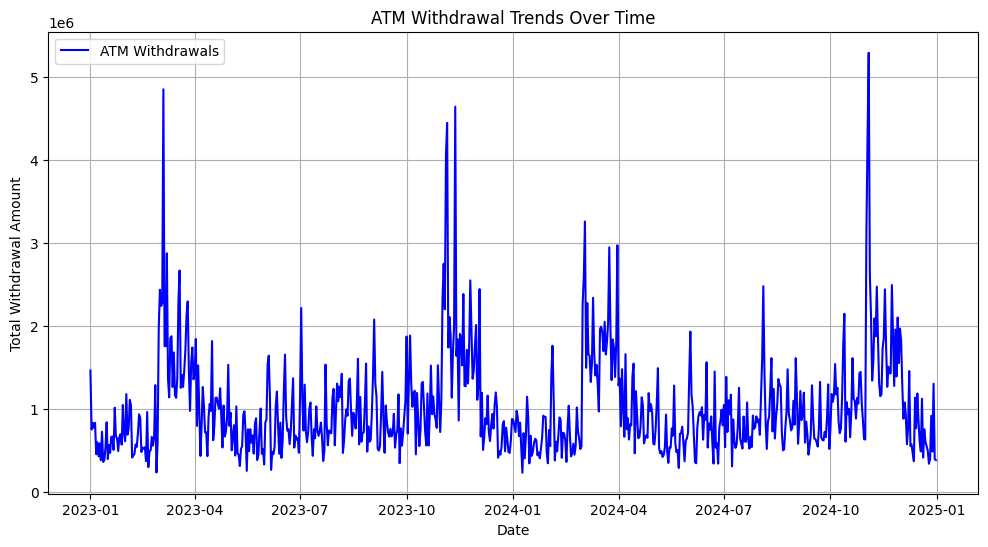

C:\Users\vibhu\AppData\Local\Temp\ipykernel_18380\2061219671.py:144: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.





        Date Festival Name  is_holiday
0 2024-01-01    No Holiday           0
1 2024-01-01    No Holiday           0
2 2024-01-01    No Holiday           0
3 2024-01-01    No Holiday           0
4 2024-01-01    No Holiday           0
        Date  is_holiday  holiday_category
0 2024-01-01           0                10
1 2024-01-01           0                10
2 2024-01-01           0                10
3 2024-01-01           0                10
4 2024-01-01           0                10


c:\Users\vibhu\miniconda3\lib\site-packages\_plotly_utils\basevalidators.py:106: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



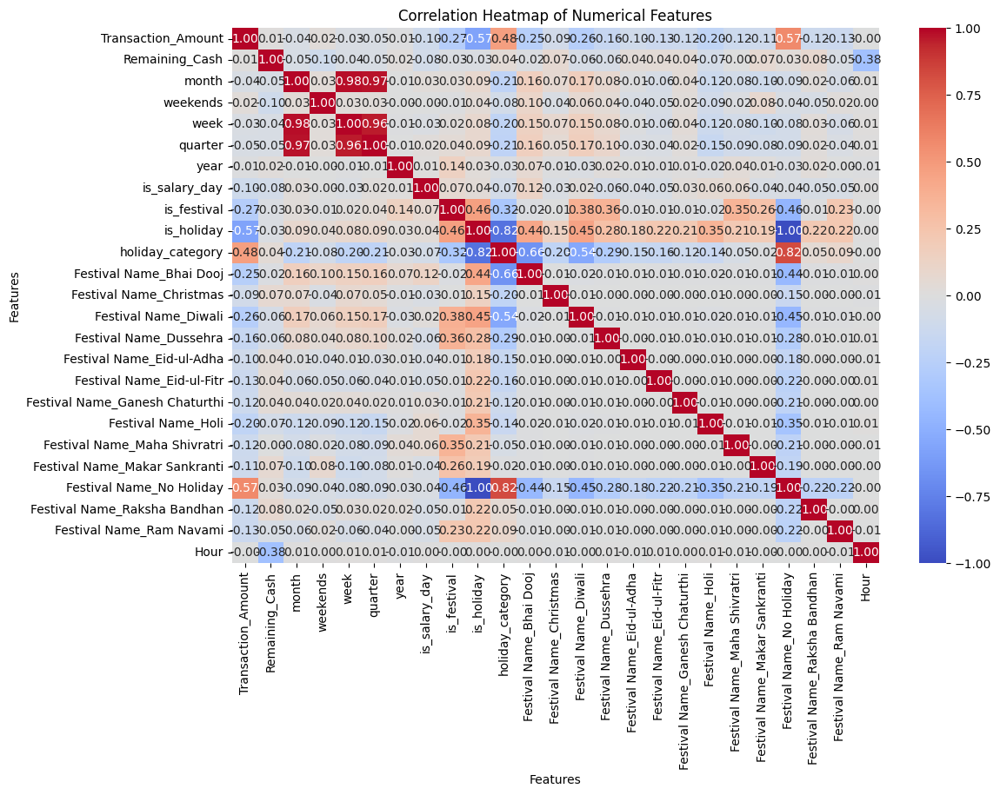

c:\Users\vibhu\miniconda3\lib\site-packages\_plotly_utils\basevalidators.py:106: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



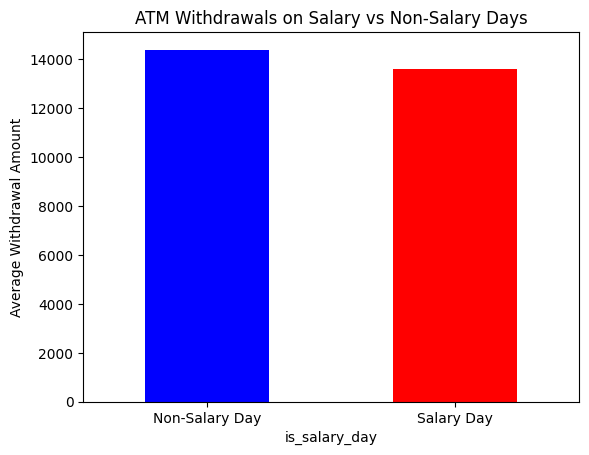

            Transaction_Amount  is_salary_day  is_holiday
Date                                                     
2023-01-01             1460700             96           0
2023-01-02              750900             55           0
2023-01-03              831300             63           0
2023-01-04              771000             55           0
2023-01-05              831500             60           0


c:\Users\vibhu\miniconda3\lib\site-packages\_plotly_utils\basevalidators.py:106: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



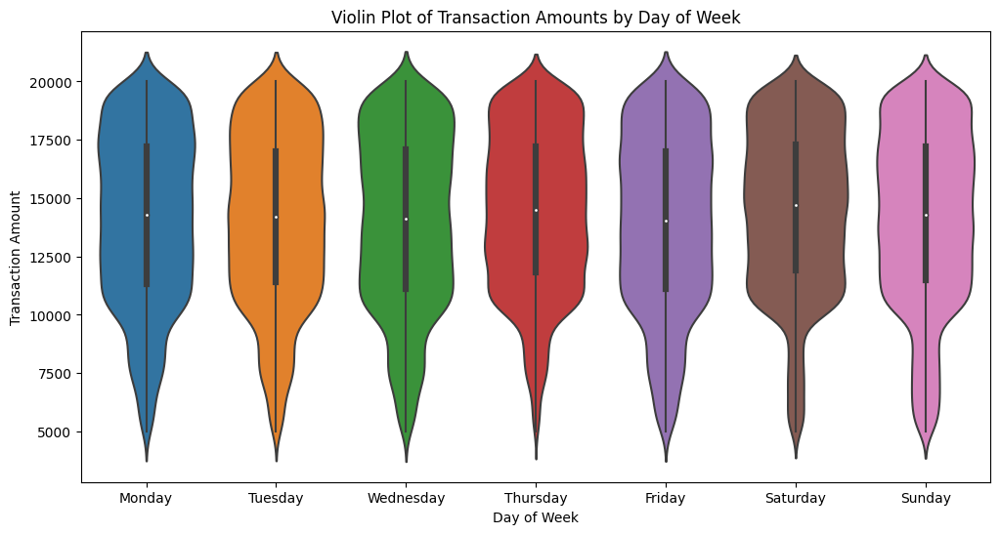

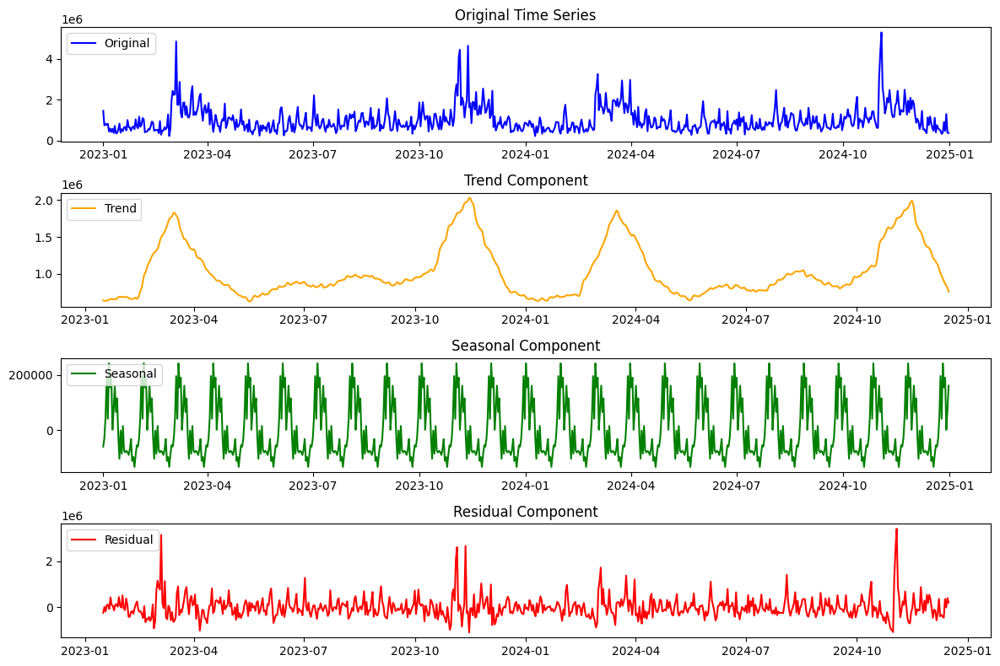

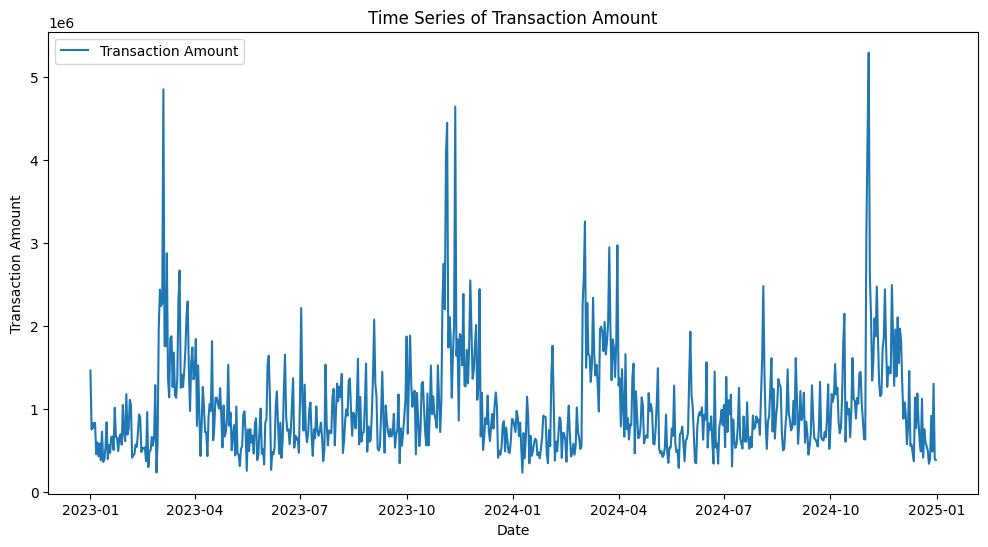

ADF Statistic: -3.074634584042142
p-value: 0.028488185260791825
Critical Values:
   1%: -3.439593802573824
   5%: -2.865619356068967
   10%: -2.568942332870462
Reject the null hypothesis (series is stationary)


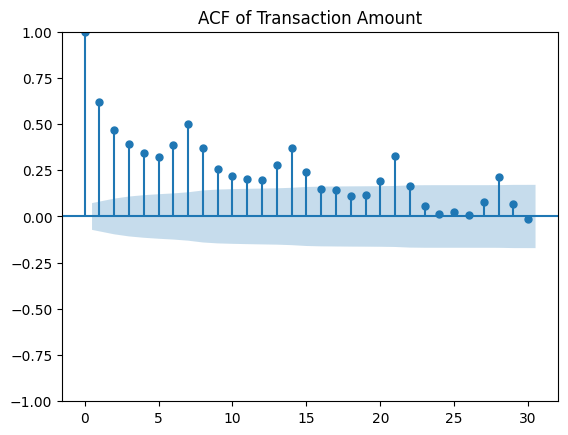

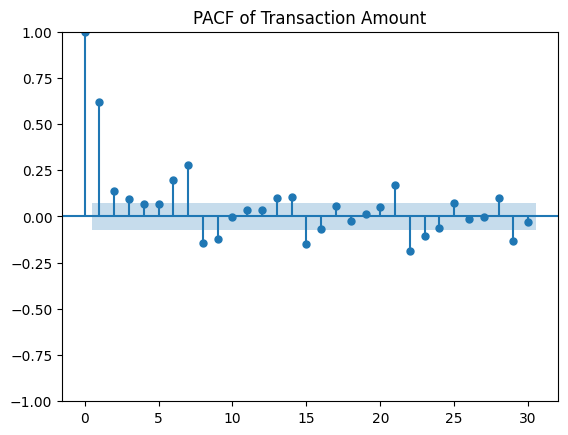

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
import plotly.io as pio
import plotly.subplots as sp
import plotly.figure_factory as ff
df= pd.read_csv(r'C:\Users\vibhu\Downloads\MSc 4th semester\ATM cash relenishment model\project1\merged_withdrawal.csv')
df.head()
df.shape # checking the no of rows and columns in the dataset
df.columns
import pandas as pd



# Display basic info
print(df.info())

# Show first few rows
print(df.head())

# Check for missing values
print(df.isnull().sum())

# Remove duplicates
df = df.drop_duplicates()

# Convert date column (replace 'date_column_name' with actual column name)
df['Date'] = pd.to_datetime(df['Date'], format='%Y-%m-%d', errors='coerce')


# Extract useful time features
df['day_of_week'] = df['Date'].dt.day_name()
df['month'] = df['Date'].dt.month

# Handle outliers using IQR method (for numerical columns)
Q1 = df['Transaction_Amount'].quantile(0.25)
Q3 = df['Transaction_Amount'].quantile(0.75)
IQR = Q3 - Q1
df = df[(df['Transaction_Amount'] >= (Q1 - 1.5 * IQR)) & (df['Transaction_Amount'] <= (Q3 + 1.5 * IQR))]




# find outliers using z-score method
from scipy import stats
z_scores = np.abs(stats.zscore(df['Transaction_Amount']))
df = df[(z_scores < 3)]
# Check for missing values again
print(df.isnull().sum())
df.head()
# Convert categorical columns to category type
df['ATM_ID'] = df['ATM_ID'].astype('category')

# plot the distribution of transaction amounts
plt.figure(figsize=(10, 6))
sns.histplot(df['Transaction_Amount'], bins=30, kde=True)
plt.title('Distribution of Transaction Amounts')
plt.xlabel('Transaction Amount')
plt.ylabel('Frequency')
plt.show()

# Create a new DataFrame with the count of transactions per day
transactions_per_day = df['Date'].dt.date.value_counts().sort_index().reset_index()
transactions_per_day.columns = ['Date', 'Number of Transactions']

# Plot the number of transactions per day
fig = px.bar(transactions_per_day, x='Date', y='Number of Transactions', 
			 labels={'Date': 'Date', 'Number of Transactions': 'Number of Transactions'}, 
			 title='Number of Transactions per Day')
fig.update_layout(xaxis_title='Date', yaxis_title='Number of Transactions', xaxis_tickangle=-45)
fig.show()


transactions_per_day = df.groupby('Date')['Transaction_Amount'].sum().reset_index()
transactions_per_day
# Plot the total withdrawal amount per day
fig = px.bar(transactions_per_day, x='Date', y='Transaction_Amount', 
			 labels={'Date': 'Date', 'Transaction_Amount': 'Total Withdrawal Amount'}, 
			 title='Total Withdrawal Amount per Day')
fig.update_layout(xaxis_title='Date', yaxis_title='Total Withdrawal Amount', xaxis_tickangle=-45)
fig.show()
# Extract day of the week, month, quarter, and year
df['day_of_week'] = df['Date'].dt.day_name() # Monday-Sunday
df['weekends'] = df['Date'].dt.dayofweek >= 5  # True for Saturday and Sunday
df['week'] = df['Date'].dt.isocalendar().week  # Week number (ISO calendar)
df['month'] = df['Date'].dt.month  # 1-12
df['quarter'] = df['Date'].dt.quarter  # 1-4
df['year'] = df['Date'].dt.year  # Year

# Check extracted features
print(df[['Date', 'day_of_week', 'month', 'quarter', 'year']].head())

import numpy as np

# Identify salary dates (assuming salaries are credited on the 1st to 8 of every month)
df['is_salary_day'] = np.where(df['Date'].dt.day <= 8, 1, 0)
# Check if salary dates are identified correctly
print(df[['Date', 'is_salary_day']].head())

# List of major festival dates (example for 2024, update as needed)
festival_dates = ["2024-01-14", "2024-03-08", "2024-04-17", "2024-10-12", "2024-11-01"]
festival_dates = pd.to_datetime(festival_dates)

# Identify festival days in the dataset
df['is_festival'] = df['Date'].isin(festival_dates).astype(int)

# Check if features are added
print(df[['Date', 'is_salary_day', 'is_festival']].head())


import matplotlib.pyplot as plt

# Aggregate data by date to see trends
df_grouped = df.groupby("Date")["Transaction_Amount"].sum()

# Plot the time series
plt.figure(figsize=(12, 6))
plt.plot(df_grouped, label="ATM Withdrawals", color="b")
plt.xlabel("Date")
plt.ylabel("Total Withdrawal Amount")
plt.title("ATM Withdrawal Trends Over Time")
plt.legend()
plt.grid()
plt.show()

holiday_df= pd.read_excel(r'C:\Users\vibhu\Downloads\MSc 4th semester\ATM cash relenishment model\project1\Book2.xlsx')

holiday_df['Date'] = pd.to_datetime(holiday_df['Date'], format='%Y-%m-%d', errors='coerce')
holiday_df['Date'] = pd.to_datetime(holiday_df['Date'], format='%Y-%m-%d', errors='coerce')


holiday_df.drop(columns=['Column1'], inplace=True)
holiday_df.head(28)
# Ensure 'Date' column in holiday_df is in datetime format
holiday_df['Date'] = pd.to_datetime(holiday_df['Date'], format='%Y-%m-%d', errors='coerce')

# Merge datasets on the date column
df = df.merge(holiday_df, how='left', left_on='Date', right_on='Date')

# Fill missing values (for non-holiday days)
df['Festival Name'].fillna("No Holiday", inplace=True)

# Create a binary holiday feature
df['is_holiday'] = (df['Festival Name'] != "No Holiday").astype(int)

print(df[['Date', 'Festival Name', 'is_holiday']].head())

df.head()
# Convert holiday names into categorical codes
df['holiday_category'] = df['Festival Name'].astype('category').cat.codes

# Ensure 'is_holiday' is numeric (0 = No Holiday, 1 = Holiday)
df['is_holiday'] = df['is_holiday'].astype(int)

# One-hot encode holiday names (optional, for ML models)
df = pd.get_dummies(df, columns=['Festival Name'])

print(df[['Date', 'is_holiday', 'holiday_category']].head())

df.head()
# 1. Heatmap of Transactions by Day of Week and Hour

# Create a pivot table for heatmap data
df['Hour'] = pd.to_datetime(df['Time'], format='%H:%M:%S').dt.hour
heatmap_data = df.pivot_table(
	values='Transaction_Amount',
	index='day_of_week',
	columns='Hour',
	aggfunc='sum'
).reindex(
	["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"]
)

# Plot the heatmap
heatmap_fig = px.imshow(
	heatmap_data,
	labels={"x": "Hour of Day", "y": "Day of Week", "color": "Transaction Amount"},
	x=heatmap_data.columns,
	y=heatmap_data.index,
	title="Heatmap of Transactions by Day of Week and Hour",
	color_continuous_scale="RdBu"
)
heatmap_fig.show()


# 2. Boxplot of Transaction Amounts by Day of Week
boxplot_fig = px.box(
	df,
	x="day_of_week",
	y="Transaction_Amount",
	category_orders={"day_of_week": ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"]},
	title="Boxplot of Transaction Amounts by Day of Week",
	labels={"day_of_week": "Day of Week", "Transaction_Amount": "Transaction Amount"}
)
boxplot_fig.show()




# 3. Monthly Transaction Trends

# Calculate monthly transaction trends
monthly_trends = df.groupby('month')['Transaction_Amount'].sum()

# Plot the monthly transaction trends
monthly_trends_fig = px.bar(
	monthly_trends,
	x=monthly_trends.index,
	y=monthly_trends.values,
	labels={"x": "Month", "y": "Total Transaction Amount"},
	title="Monthly Transaction Trends"
)
monthly_trends_fig.update_xaxes(
	tickvals=list(range(1, 13)),
	ticktext=["Jan", "Feb", "Mar", "Apr", "May", "Jun", "Jul", "Aug", "Sep", "Oct", "Nov", "Dec"]
)
monthly_trends_fig.show()


# 4. Distribution of Transaction Amounts (Log Scale)
distribution_fig = px.histogram(
	df,
	x="Transaction_Amount",
	nbins=50,
	log_y=True,
	title="Distribution of Transaction Amounts (Log Scale)",
	labels={"Transaction_Amount": "Transaction Amount (Log Scale)", "count": "Frequency"}
)
distribution_fig.show()


# 5. Transactions on Holidays vs Non-Holidays

# Calculate average transaction amounts for holidays and non-holidays
holiday_comparison = df.groupby('is_holiday')['Transaction_Amount'].mean()

# Plot the comparison
holiday_comparison_fig = px.bar(
	holiday_comparison,
	x=holiday_comparison.index,
	y=holiday_comparison.values,
	labels={"x": "Holiday Status", "y": "Average Transaction Amount"},
	title="Average Transactions on Holidays vs Non-Holidays"
)
holiday_comparison_fig.update_xaxes(tickvals=[0, 1], ticktext=["Non-Holiday", "Holiday"])
holiday_comparison_fig.show()


# 6. Time Series of Daily Transactions
time_series_fig = px.line(
	df_grouped,
	x=df_grouped.index,
	y=df_grouped.values,
	labels={"x": "Date", "y": "Total Transaction Amount"},
	title="Time Series of Daily Transactions"
)
time_series_fig.show()


# 7. Correlation Heatmap of Numerical Features

# Calculate the correlation matrix for numerical features
correlation_matrix = df.corr(numeric_only=True)

# Plot the correlation heatmap using seaborn
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap="coolwarm", cbar=True)
plt.title("Correlation Heatmap of Numerical Features")
plt.xlabel("Features")
plt.ylabel("Features")
plt.show()


# 8. Festival vs Non-Festival Transactions

# Calculate average transaction amounts for festival and non-festival days
festival_comparison = df.groupby('is_festival')['Transaction_Amount'].mean()

# Plot the comparison
festival_comparison_fig = px.bar(
	festival_comparison,
	x=festival_comparison.index,
	y=festival_comparison.values,
	labels={"x": "Festival Status", "y": "Average Transaction Amount"},
	title="Average Transactions on Festivals vs Non-Festivals"
)
festival_comparison_fig.update_xaxes(tickvals=[0, 1], ticktext=["Non-Festival", "Festival"])
festival_comparison_fig.show()


# 9. Interactive Plotly Line Chart for Daily Transactions
daily_transactions_fig = px.line(
	transactions_per_day,
	x="Date",
	y="Transaction_Amount",
	title="Daily Transactions Over Time",
	labels={"Transaction_Amount": "Transaction Amount"}
)
daily_transactions_fig.show()
import matplotlib.pyplot as plt

# Group by salary days
salary_trend = df.groupby('is_salary_day')['Transaction_Amount'].mean()

# Plot salary vs non-salary day withdrawals
salary_trend.plot(kind='bar', color=['blue', 'red'])
plt.xticks(ticks=[0, 1], labels=['Non-Salary Day', 'Salary Day'], rotation=0)
plt.ylabel("Average Withdrawal Amount")
plt.title("ATM Withdrawals on Salary vs Non-Salary Days")
plt.show()

# Ensure 'Date' is the index for time series modeling
if 'Date' not in df.index.names:
	df.set_index("Date", inplace=True)

# Keep only necessary columns
time_series_data = df[['Transaction_Amount', 'is_salary_day', 'is_holiday']]

# Resample daily to ensure no missing dates
time_series_data = time_series_data.resample('D').sum()

# Check final dataset
print(time_series_data.head())

# Plot the time series data using Plotly Express
time_series_fig = px.line(
	time_series_data,
	x=time_series_data.index,
	y="Transaction_Amount",
	title="Time Series of ATM Total Amount Withdrawals (2023 and 2024)",
	labels={"Transaction_Amount": "Transaction Amount", "index": "Date"}
)

# Add festival names as annotations on peaks for both years
for _, row in holiday_df.iterrows():
	festival_date = row['Date']
	festival_name = row['Festival Name']
	if festival_date in time_series_data.index:
		transaction_amount = time_series_data.loc[festival_date, 'Transaction_Amount']
		time_series_fig.add_annotation(
			x=festival_date,
			y=transaction_amount,
			text=festival_name,
			showarrow=True,
			arrowhead=2,
			ax=0,
			ay=-40
		)

time_series_fig.show()

# Create a violin plot for Transaction Amounts by Day of Week
plt.figure(figsize=(12, 6))
sns.violinplot(x='day_of_week', y='Transaction_Amount', data=df, order=["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"])
plt.title('Violin Plot of Transaction Amounts by Day of Week')
plt.xlabel('Day of Week')
plt.ylabel('Transaction Amount')
plt.show()
from statsmodels.tsa.seasonal import seasonal_decompose

# Perform seasonal decomposition
decomposition = seasonal_decompose(time_series_data['Transaction_Amount'], model='additive', period=30)

# Extract components
trend = decomposition.trend
seasonal = decomposition.seasonal
residual = decomposition.resid

# Plot the decomposition
plt.figure(figsize=(12, 8))

plt.subplot(411)
plt.plot(time_series_data['Transaction_Amount'], label='Original', color='blue')
plt.legend(loc='upper left')
plt.title('Original Time Series')

plt.subplot(412)
plt.plot(trend, label='Trend', color='orange')
plt.legend(loc='upper left')
plt.title('Trend Component')

plt.subplot(413)
plt.plot(seasonal, label='Seasonal', color='green')
plt.legend(loc='upper left')
plt.title('Seasonal Component')

plt.subplot(414)
plt.plot(residual, label='Residual', color='red')
plt.legend(loc='upper left')
plt.title('Residual Component')

plt.tight_layout()
plt.show()

# adf test for stationarity
from statsmodels.tsa.stattools import adfuller
def adf_test(series):
	result = adfuller(series)
	print('ADF Statistic:', result[0])
	print('p-value:', result[1])
	print('Critical Values:')
	for key, value in result[4].items():
		print(f'   {key}: {value}')
	# Interpret the result
	if result[1] <= 0.05:
		print("Reject the null hypothesis (series is stationary)")
	else:
		print("Fail to reject the null hypothesis (series is non-stationary)")	

# Check for stationarity
# Plot the time series data
plt.figure(figsize=(12, 6))
plt.plot(time_series_data['Transaction_Amount'], label='Transaction Amount')
plt.title('Time Series of Transaction Amount')
plt.xlabel('Date')
plt.ylabel('Transaction Amount')
plt.legend()
plt.show()

# Perform ADF test on the time series data
adf_test(time_series_data['Transaction_Amount'])
# Plot ACF and PACF
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.stattools import acf, pacf

# Compute ACF and PACF values
acf_values = acf(time_series_data['Transaction_Amount'], nlags=30, fft=True)
pacf_values = pacf(time_series_data['Transaction_Amount'], nlags=30)

plot_acf(time_series_data['Transaction_Amount'], lags=30)	

plt.title('ACF of Transaction Amount')
plt.show()

plot_pacf(time_series_data['Transaction_Amount'], lags=30)
plt.title('PACF of Transaction Amount')
plt.show()




from statsmodels.tsa.stattools import acf, pacf

# Calculate ACF and PACF values
acf_values = acf(time_series_data['Transaction_Amount'], nlags=30, fft=True)
pacf_values = pacf(time_series_data['Transaction_Amount'], nlags=30)

# Plot ACF using Plotly Express
acf_fig = px.line(x=range(1, 31), y=acf_values[1:], 
				  labels={'x': 'Lag', 'y': 'ACF'}, title='ACF of Transaction Amount')
acf_fig.show()

# Plot PACF using Plotly Express
pacf_fig = px.line(x=range(1, 31), y=pacf_values[1:], 
				   labels={'x': 'Lag', 'y': 'PACF'}, title='PACF of Transaction Amount')
pacf_fig.show()


In [3]:
from statsmodels.tsa.arima.model import ARIMA
# Fit ARIMA Model (order = (p, d, q))
model = ARIMA(time_series_data['Transaction_Amount'], order=(5,1,0))
model_fit = model.fit()
# Print model summary
print(model_fit.summary())

# Forecast next 30 days
forecast = model_fit.forecast(steps=30)



#check accuracy of the model
from sklearn.metrics import mean_squared_error, mean_absolute_error
from math import sqrt

# Calculate fitted values
fitted_values = model_fit.predict(start=0, end=len(time_series_data)-1)

# Calculate RMSE and MAE
rmse = sqrt(mean_squared_error(time_series_data['Transaction_Amount'], fitted_values))
mae = mean_absolute_error(time_series_data['Transaction_Amount'], fitted_values)
mape = np.mean(np.abs((time_series_data['Transaction_Amount'] - fitted_values) / time_series_data['Transaction_Amount'])) * 100
print(f"RMSE: {rmse}, MAE: {mae}, MAPE: {mape}%")

from pmdarima import auto_arima
from statsmodels.tsa.statespace.sarimax import SARIMAX

# Define the exogenous variables
exog_variables = time_series_data[['is_salary_day', 'is_holiday']]

# Fit auto ARIMA model with exogenous variables
Auto_arima_model = auto_arima(
	time_series_data['Transaction_Amount'], 
	exogenous=exog_variables, 
	seasonal=True, 
	m=7
)

# Fit SARIMAX Model with exogenous variables
Sarimax_model = SARIMAX(
	time_series_data['Transaction_Amount'], 
	order=(1, 1, 1), 
	seasonal_order=(1, 1, 1, 7), 
	exog=exog_variables
)
Sarimax_model_fit = Sarimax_model.fit()

# Print model summaries
print("Auto ARIMA Model Summary:")
print(Auto_arima_model.summary())
print("\nSARIMAX Model Summary:")
print(Sarimax_model_fit.summary())

                               SARIMAX Results                                
Dep. Variable:     Transaction_Amount   No. Observations:                  731
Model:                 ARIMA(5, 1, 0)   Log Likelihood              -10567.065
Date:                Fri, 25 Apr 2025   AIC                          21146.129
Time:                        17:24:21   BIC                          21173.687
Sample:                    01-01-2023   HQIC                         21156.761
                         - 12-31-2024                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.4516      0.020    -22.511      0.000      -0.491      -0.412
ar.L2         -0.3499      0.023    -15.002      0.000      -0.396      -0.304
ar.L3         -0.2831      0.025    -11.114      0.0

c:\Users\vibhu\miniconda3\lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

c:\Users\vibhu\miniconda3\lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

c:\Users\vibhu\miniconda3\lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

c:\Users\vibhu\miniconda3\lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

c:\Users\vibhu\miniconda3\lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

c:\Users\vibhu\miniconda3\lib\site-packages\sklearn\utils\deprecation.py:151: Fu

Auto ARIMA Model Summary:
                                      SARIMAX Results                                      
Dep. Variable:                                   y   No. Observations:                  731
Model:             SARIMAX(5, 0, 3)x(1, 0, [1], 7)   Log Likelihood              -10477.978
Date:                             Fri, 25 Apr 2025   AIC                          20979.956
Time:                                     17:27:50   BIC                          21035.089
Sample:                                 01-01-2023   HQIC                         21001.225
                                      - 12-31-2024                                         
Covariance Type:                               opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept   2.014e+05   1.92e-07   1.05e+12      0.000    2.01e+05    2.01e+05
a

In [6]:
import numpy as np
import pandas as pd
import random
from statsmodels.tsa.statespace.sarimax import SARIMAX
from pmdarima import auto_arima
from sklearn.metrics import mean_squared_error

# --------------------------
# RL Agent for Hyperparameter Tuning (Simple Q-Learning)
# --------------------------
class RLHyperparameterTuner:
    def __init__(self, initial_order, epsilon=0.3, learning_rate=0.1, gamma=0.9):
        """
        initial_order: starting SARIMAX order [p, d, q]
        epsilon: exploration rate (0-1)
        learning_rate: step size for Q-value updates
        gamma: discount factor
        """
        self.order = list(initial_order)
        self.epsilon = epsilon
        self.lr = learning_rate
        self.gamma = gamma
        self.q_table = {}  # maps ((state), action) -> Q value
        
        # Discrete actions for adjusting each element of (p, d, q)
        self.actions = [
            (-1,  0,  0),
            ( 1,  0,  0),
            ( 0, -1,  0),
            ( 0,  1,  0),
            ( 0,  0, -1),
            ( 0,  0,  1),
            ( 0,  0,  0)  # no change action
        ]
    
    def get_q(self, state, action):
        return self.q_table.get((tuple(state), action), 0)
    
    def choose_action(self, state):
        # Exploration vs. Exploitation
        if np.random.rand() < self.epsilon:
            return random.choice(self.actions)
        else:
            q_values = [self.get_q(state, a) for a in self.actions]
            max_q = max(q_values)
            best_actions = [a for a, q in zip(self.actions, q_values) if q == max_q]
            return random.choice(best_actions)
    
    def update_q_table(self, state, action, reward, next_state):
        max_next_q = max([self.get_q(next_state, a) for a in self.actions])
        old_q = self.get_q(state, action)
        new_q = old_q + self.lr * (reward + self.gamma * max_next_q - old_q)
        self.q_table[(tuple(state), action)] = new_q
        
    def update_order(self, order, action):
        # Adjust order ensuring no parameter goes below zero
        return [max(0, o + a) for o, a in zip(order, action)]


# --------------------------
# Generative Forecasting Pipeline Class
# --------------------------
class GenerativeForecastingPipeline:
    def __init__(self, data, target_col, exog_cols, initial_train_fraction=0.5, forecast_steps=7, episodes=10):
        """
        data: Pandas DataFrame containing historical data.
        target_col: Name of the column to forecast.
        exog_cols: List of column names for exogenous features.
        initial_train_fraction: Fraction of data used for the initial training period.
        forecast_steps: Forecast horizon (e.g., 7 steps for a weekly forecast).
        episodes: Number of RL search episodes.
        """
        self.data = data.sort_index()  # Ensure data is time-ordered
        self.target_col = target_col
        self.exog_cols = exog_cols
        self.exog_data = data[exog_cols]
        self.forecast_steps = forecast_steps
        self.initial_train_size = int(len(data) * initial_train_fraction)
        self.episodes = episodes
        self.best_ensemble_mse = np.inf
        self.best_model_info = {}
        self.agent = RLHyperparameterTuner(initial_order=[1, 1, 1])
    
    # --------------------------
    # Walk-Forward Cross-Validation Function
    # --------------------------
    def walk_forward_validation(self, model_func):
        """
        model_func: Function that fits and returns a model given training data and exogenous features.
        Returns average MSE error and a list of forecasts for each CV split.
        """
        errors = []
        forecasts_list = []
        n = len(self.data)
        for i in range(self.initial_train_size, n - self.forecast_steps + 1):
            train_data = self.data.iloc[:i]
            val_data = self.data.iloc[i:i + self.forecast_steps]
            exog_train = self.exog_data.iloc[:i]
            exog_val = self.exog_data.iloc[i:i + self.forecast_steps]
            
            model = model_func(train_data, exog_train)
            # Handle SARIMAX (get_forecast) vs. auto_arima (predict)
            try:
                forecast = model.get_forecast(steps=self.forecast_steps, exog=exog_val).predicted_mean.values
            except AttributeError:
                forecast = model.predict(n_periods=self.forecast_steps, exogenous=exog_val)
            
            error = mean_squared_error(val_data[self.target_col], forecast)
            errors.append(error)
            forecasts_list.append(forecast)
        avg_error = np.mean(errors)
        return avg_error, forecasts_list

    # --------------------------
    # SARIMAX Model Function using a provided order 
    # --------------------------
    def sarimax_model_func(self, train_data, exog_train, order):
        seasonal_order = (order[0], order[1], order[2], 7)  # Fixed seasonal period of 7
        model = SARIMAX(train_data[self.target_col],
                        order=tuple(order),
                        seasonal_order=seasonal_order,
                        exog=exog_train)
        return model.fit(disp=False)
    
    # --------------------------
    # auto_arima Model Function
    # --------------------------
    def auto_arima_model_func(self, train_data, exog_train):
        model = auto_arima(train_data[self.target_col],
                           exogenous=exog_train,
                           seasonal=True,
                           m=7,
                           error_action='ignore',
                           suppress_warnings=True,
                           trace=False)
        return model

    # --------------------------
    # Ensemble Forecasting: Weighted Average using Inverse Error
    # --------------------------
    def ensemble_forecast(self, forecasts_sar, forecasts_auto, mse_sar, mse_auto):
        # Calculate weights (small epsilon to avoid division by zero)
        epsilon = 1e-8
        w_sar = 1 / (mse_sar + epsilon)
        w_auto = 1 / (mse_auto + epsilon)
        
        ensemble_forecasts = []
        for fs, fa in zip(forecasts_sar, forecasts_auto):
            forecast_ens = (w_sar * np.array(fs) + w_auto * np.array(fa)) / (w_sar + w_auto)
            ensemble_forecasts.append(forecast_ens)
        return ensemble_forecasts

    # --------------------------
    # Fit Method: Runs the full tuning, evaluation and ensemble pipeline
    # --------------------------
    def fit(self):
        print("Starting the generative forecasting model training...")
        for ep in range(self.episodes):
            # RL-based tuning: adjust SARIMAX order
            state = self.agent.order
            action = self.agent.choose_action(state)
            proposed_order = self.agent.update_order(state, action)
            print(f"Episode {ep+1}: Proposed SARIMAX Order: {tuple(proposed_order)}")
            
            # Define import wrapper using the proposed order for SARIMAX
            def sarimax_wrapper(train_data, exog_train):
                return self.sarimax_model_func(train_data, exog_train, proposed_order)
            
            mse_sar, forecasts_sar = self.walk_forward_validation(sarimax_wrapper)
            mse_auto, forecasts_auto = self.walk_forward_validation(self.auto_arima_model_func)
            
            print(f"  SARIMAX CV MSE: {mse_sar:.4f} | auto_arima CV MSE: {mse_auto:.4f}")
            
            # Compute ensemble forecasts across CV splits
            ensemble_forecasts = self.ensemble_forecast(forecasts_sar, forecasts_auto, mse_sar, mse_auto)
            # Compute CV ensemble error across windows
            cv_errors = []
            for idx, forecast in enumerate(ensemble_forecasts):
                # Retrieve the true values from the corresponding window
                start = self.initial_train_size + idx
                end = start + self.forecast_steps
                true_vals = self.data[self.target_col].iloc[start:end].values
                cv_errors.append(mean_squared_error(true_vals, forecast))
            mse_ensemble = np.mean(cv_errors)
            print(f"  Ensemble CV MSE: {mse_ensemble:.4f}")
            
            # RL Reward: we use negative SARIMAX error (you may experiment with ensemble error)
            reward = -mse_sar
            next_state = proposed_order
            self.agent.update_q_table(state, action, reward, next_state)
            
            # Save best observed ensemble performance and associated model details
            if mse_ensemble < self.best_ensemble_mse:
                self.best_ensemble_mse = mse_ensemble
                # Also fetch auto_arima order from one fit for reference
                auto_fit_sample = self.auto_arima_model_func(self.data.iloc[:self.initial_train_size],
                                                               self.exog_data.iloc[:self.initial_train_size])
                self.best_model_info = {
                    "model_type": "Ensemble",
                    "ensemble_cv_mse": mse_ensemble,
                    "sarimax_order": proposed_order,
                    "auto_arima_order": auto_fit_sample.order if hasattr(auto_fit_sample, 'order') else None,
                    "q_table": self.agent.q_table.copy()
                }
            
            # Optionally update the RL agent's state if SARIMAX outperforms auto_arima in this episode
            if mse_sar < mse_auto:
                self.agent.order = proposed_order
            
            print(f"  Best Ensemble CV MSE so far: {self.best_ensemble_mse:.4f}\n")
        
        print("Training complete!")
        print("Final Best Model Information:")
        print(self.best_model_info)
        return self.best_model_info
    
    # --------------------------
    # Forecasting using the best ensemble (assuming new exogenous data is provided)
    # --------------------------
    def predict(self, steps, new_exog):
        # For a simple prediction scenario, we re-fit both models on all available data.
        full_data = self.data.copy()
        exog_full = self.exog_data.copy()
        # Fit SARIMAX with the best RL-tuned order
        best_order = self.best_model_info.get("sarimax_order", [1, 1, 1])
        sarimax_fit = self.sarimax_model_func(full_data, exog_full, best_order)
        try:
            forecast_sar = sarimax_fit.get_forecast(steps=steps, exog=new_exog).predicted_mean.values
        except:
            forecast_sar = sarimax_fit.predict(n_periods=steps, exogenous=new_exog)
        
        # Fit auto_arima on full data
        auto_fit = self.auto_arima_model_func(full_data, exog_full)
        forecast_auto = auto_fit.predict(n_periods=steps, exogenous=new_exog)
        
        # Compute weights based on in-sample CV errors (using latest computed errors, here as a proxy)
        # In a production system, these could be stored as attributes.
        epsilon = 1e-8
        mse_sar = mean_squared_error(full_data[self.target_col].tail(steps), forecast_sar[:steps]) if len(full_data) >= steps else 1.0
        mse_auto = mean_squared_error(full_data[self.target_col].tail(steps), forecast_auto[:steps]) if len(full_data) >= steps else 1.0
        w_sar = 1 / (mse_sar + epsilon)
        w_auto = 1 / (mse_auto + epsilon)
        ensemble_forecast = (w_sar * np.array(forecast_sar) + w_auto * np.array(forecast_auto)) / (w_sar + w_auto)
        return ensemble_forecast





In [7]:
# --------------------------
# Example Usage:
# --------------------------
if __name__ == "__main__":
    # For demonstration, suppose you load your data from CSV (replace with your dataset)
    # The dataset must include at least one target column and exogenous columns.
    # For example:
    # data = pd.read_csv("your_time_series_data.csv", parse_dates=["date"], index_col="date")
    
    # Here, we simulate a sample time series DataFrame.
    dates = pd.date_range(start="2020-01-01", periods=300, freq="D")
    np.random.seed(42)
    data = pd.DataFrame({
        "Transaction_Amount": np.random.randn(300).cumsum() + 50,
        "is_salary_day": np.random.randint(0, 2, size=300),
        "is_holiday": np.random.randint(0, 2, size=300)
    }, index=dates)
    
    # Instantiate and run the generative forecasting pipeline:
    pipeline = GenerativeForecastingPipeline(
        data=data,
        target_col="Transaction_Amount",
        exog_cols=["is_salary_day", "is_holiday"],
        initial_train_fraction=0.5,
        forecast_steps=7,
        episodes=10
    )
    
    best_model_info = pipeline.fit()
    
    # Suppose you want to forecast the next 7 days with new exogenous data (here, we simulate it)
    new_exog = pd.DataFrame({
        "is_salary_day": [0, 1, 0, 0, 1, 0, 0],
        "is_holiday": [0, 0, 1, 0, 0, 1, 0]
    })
    forecast = pipeline.predict(steps=7, new_exog=new_exog)
    print("Ensemble Forecast for the next 7 steps:")
    print(forecast)

Starting the generative forecasting model training...
Episode 1: Proposed SARIMAX Order: (0, 1, 1)


c:\Users\vibhu\miniconda3\lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

c:\Users\vibhu\miniconda3\lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

c:\Users\vibhu\miniconda3\lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

c:\Users\vibhu\miniconda3\lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

c:\Users\vibhu\miniconda3\lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

c:\Users\vibhu\miniconda3\lib\site-packages\sklearn\utils\deprecation.py:151: Fu

  SARIMAX CV MSE: 4.0270 | auto_arima CV MSE: 3.7694
  Ensemble CV MSE: 3.8669


c:\Users\vibhu\miniconda3\lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

c:\Users\vibhu\miniconda3\lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

c:\Users\vibhu\miniconda3\lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

c:\Users\vibhu\miniconda3\lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

c:\Users\vibhu\miniconda3\lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

c:\Users\vibhu\miniconda3\lib\site-packages\sklearn\utils\deprecation.py:151: Fu

  Best Ensemble CV MSE so far: 3.8669

Episode 2: Proposed SARIMAX Order: (2, 1, 1)


c:\Users\vibhu\miniconda3\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\vibhu\miniconda3\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\vibhu\miniconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning:

Non-invertible starting MA parameters found. Using zeros as starting parameters.

c:\Users\vibhu\miniconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning:

Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.

c:\Users\vibhu\miniconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning:

Non-invertible starting MA parameters found. Using zeros as starting parameters.

c:\Users\vibhu\miniconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning:

Non-

  SARIMAX CV MSE: 3.9602 | auto_arima CV MSE: 3.7694
  Ensemble CV MSE: 3.8317


c:\Users\vibhu\miniconda3\lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

c:\Users\vibhu\miniconda3\lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

c:\Users\vibhu\miniconda3\lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

c:\Users\vibhu\miniconda3\lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

c:\Users\vibhu\miniconda3\lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

c:\Users\vibhu\miniconda3\lib\site-packages\sklearn\utils\deprecation.py:151: Fu

  Best Ensemble CV MSE so far: 3.8317

Episode 3: Proposed SARIMAX Order: (1, 1, 0)


c:\Users\vibhu\miniconda3\lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

c:\Users\vibhu\miniconda3\lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

c:\Users\vibhu\miniconda3\lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

c:\Users\vibhu\miniconda3\lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

c:\Users\vibhu\miniconda3\lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

c:\Users\vibhu\miniconda3\lib\site-packages\sklearn\utils\deprecation.py:151: Fu

  SARIMAX CV MSE: 6.1917 | auto_arima CV MSE: 3.7694
  Ensemble CV MSE: 4.2860
  Best Ensemble CV MSE so far: 3.8317

Episode 4: Proposed SARIMAX Order: (1, 2, 1)


c:\Users\vibhu\miniconda3\lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

c:\Users\vibhu\miniconda3\lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

c:\Users\vibhu\miniconda3\lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

c:\Users\vibhu\miniconda3\lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

c:\Users\vibhu\miniconda3\lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

c:\Users\vibhu\miniconda3\lib\site-packages\sklearn\utils\deprecation.py:151: Fu

  SARIMAX CV MSE: 6.9456 | auto_arima CV MSE: 3.7694
  Ensemble CV MSE: 4.3129
  Best Ensemble CV MSE so far: 3.8317

Episode 5: Proposed SARIMAX Order: (1, 1, 1)


c:\Users\vibhu\miniconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning:

Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.

c:\Users\vibhu\miniconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning:

Non-invertible starting MA parameters found. Using zeros as starting parameters.

c:\Users\vibhu\miniconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning:

Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.

c:\Users\vibhu\miniconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning:

Non-invertible starting MA parameters found. Using zeros as starting parameters.

c:\Users\vibhu\miniconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning:

Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.

c:\Users\vibhu\miniconda3\lib\site-packages\stats

  SARIMAX CV MSE: 4.0294 | auto_arima CV MSE: 3.7694
  Ensemble CV MSE: 3.8678
  Best Ensemble CV MSE so far: 3.8317

Episode 6: Proposed SARIMAX Order: (1, 0, 1)


c:\Users\vibhu\miniconda3\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\vibhu\miniconda3\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\vibhu\miniconda3\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\vibhu\miniconda3\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\vibhu\miniconda3\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\vibhu\miniconda3\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

  SARIMAX CV MSE: 10232239.3366 | auto_arima CV MSE: 3.7694
  Ensemble CV MSE: 3.7694


c:\Users\vibhu\miniconda3\lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

c:\Users\vibhu\miniconda3\lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

c:\Users\vibhu\miniconda3\lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

c:\Users\vibhu\miniconda3\lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

c:\Users\vibhu\miniconda3\lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

c:\Users\vibhu\miniconda3\lib\site-packages\sklearn\utils\deprecation.py:151: Fu

  Best Ensemble CV MSE so far: 3.7694

Episode 7: Proposed SARIMAX Order: (1, 1, 2)


c:\Users\vibhu\miniconda3\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\vibhu\miniconda3\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\vibhu\miniconda3\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\vibhu\miniconda3\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\vibhu\miniconda3\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\vibhu\miniconda3\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

  SARIMAX CV MSE: 3.9910 | auto_arima CV MSE: 3.7694
  Ensemble CV MSE: 3.8483
  Best Ensemble CV MSE so far: 3.7694

Episode 8: Proposed SARIMAX Order: (2, 1, 1)


c:\Users\vibhu\miniconda3\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\vibhu\miniconda3\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\vibhu\miniconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning:

Non-invertible starting MA parameters found. Using zeros as starting parameters.

c:\Users\vibhu\miniconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning:

Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.

c:\Users\vibhu\miniconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning:

Non-invertible starting MA parameters found. Using zeros as starting parameters.

c:\Users\vibhu\miniconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning:

Non-

  SARIMAX CV MSE: 3.9602 | auto_arima CV MSE: 3.7694
  Ensemble CV MSE: 3.8317
  Best Ensemble CV MSE so far: 3.7694

Episode 9: Proposed SARIMAX Order: (1, 0, 1)


c:\Users\vibhu\miniconda3\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\vibhu\miniconda3\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\vibhu\miniconda3\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\vibhu\miniconda3\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\vibhu\miniconda3\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\vibhu\miniconda3\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

  SARIMAX CV MSE: 10232239.3366 | auto_arima CV MSE: 3.7694
  Ensemble CV MSE: 3.7694
  Best Ensemble CV MSE so far: 3.7694

Episode 10: Proposed SARIMAX Order: (1, 1, 2)


c:\Users\vibhu\miniconda3\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\vibhu\miniconda3\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\vibhu\miniconda3\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\vibhu\miniconda3\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\vibhu\miniconda3\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\vibhu\miniconda3\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

  SARIMAX CV MSE: 3.9910 | auto_arima CV MSE: 3.7694
  Ensemble CV MSE: 3.8483
  Best Ensemble CV MSE so far: 3.7694

Training complete!
Final Best Model Information:
{'model_type': 'Ensemble', 'ensemble_cv_mse': 3.769381001133491, 'sarimax_order': [1, 0, 1], 'auto_arima_order': (0, 1, 0), 'q_table': {((1, 1, 1), (-1, 0, 0)): -0.40269953058394253, ((1, 1, 1), (1, 0, 0)): -0.39602223284932087, ((1, 1, 1), (0, 0, -1)): -0.6191656747723302, ((1, 1, 1), (0, 1, 0)): -0.6945594475332698, ((1, 1, 1), (0, 0, 0)): -0.4029399270326094, ((1, 1, 1), (0, -1, 0)): -1023223.9336564133}}


c:\Users\vibhu\miniconda3\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\vibhu\miniconda3\lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

c:\Users\vibhu\miniconda3\lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

c:\Users\vibhu\miniconda3\lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

c:\Users\vibhu\miniconda3\lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

c:\Users\vibhu\miniconda3\lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'fo

Ensemble Forecast for the next 7 steps:
[48.29757517 48.30723281 48.37689047 48.25557136 48.27868398 48.3313191
 48.22435005]


c:\Users\vibhu\miniconda3\lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

c:\Users\vibhu\miniconda3\lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



In [21]:
from sklearn.metrics import mean_squared_error, mean_absolute_error
import numpy as np

# Calculate RMSE
rmse = np.sqrt(mean_squared_error(time_series_data['Transaction_Amount'], fitted_values))

# Calculate MAE
mae = mean_absolute_error(time_series_data['Transaction_Amount'], fitted_values)

# Calculate MAPE
mape = np.mean(np.abs((time_series_data['Transaction_Amount'] - fitted_values) / time_series_data['Transaction_Amount'])) * 100

# Print the metrics
print(f"RMSE: {rmse}")
print(f"MAE: {mae}")
print(f"MAPE: {mape}%")


RMSE: 470800.1006054491
MAE: 321332.26929205435
MAPE: 35.04583942913046%


In [19]:
from prophet import Prophet
import pandas as pd

import matplotlib.pyplot as plt

# Prepare the data for Prophet
# Prophet requires a DataFrame with two columns: 'ds' (date) and 'y' (value)
prophet_data = time_series_data.reset_index()[['Date', 'Transaction_Amount']]
prophet_data.rename(columns={'Date': 'ds', 'Transaction_Amount': 'y'}, inplace=True)

# Initialize the Prophet model
model = Prophet(daily_seasonality=True, yearly_seasonality=True)

# Fit the model
model.fit(prophet_data)

# Create a DataFrame for future dates
future_dates = model.make_future_dataframe(periods=30)  # Forecast for the next 30 days

# Generate the forecast
forecast = model.predict(future_dates)

# Plot the forecast using Plotly Express
forecast_fig = px.line(
	forecast,
	x="ds",
	y="yhat",
	title="Prophet Forecast",
	labels={"ds": "Date", "yhat": "Transaction Amount"}
)

# Add confidence intervals to the plot
forecast_fig.add_scatter(
	x=forecast["ds"],
	y=forecast["yhat_lower"],
	mode="lines",
	line=dict(color="orange", dash="dot"),
	name="Lower Confidence Interval"
)
forecast_fig.add_scatter(
	x=forecast["ds"],
	y=forecast["yhat_upper"],
	mode="lines",
	line=dict(color="orange", dash="dot"),
	name="Upper Confidence Interval"
)

# Show the plot
forecast_fig.show()


02:48:53 - cmdstanpy - INFO - Chain [1] start processing
02:48:53 - cmdstanpy - INFO - Chain [1] done processing
c:\Users\vibhu\miniconda3\lib\site-packages\_plotly_utils\basevalidators.py:106: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result

c:\Users\vibhu\miniconda3\lib\site-packages\_plotly_utils\basevalidators.py:106: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



In [20]:
from sklearn.metrics import mean_squared_error, mean_absolute_error
import numpy as np

# Calculate RMSE
rmse = np.sqrt(mean_squared_error(time_series_data['Transaction_Amount'], fitted_values))

# Calculate MAE
mae = mean_absolute_error(time_series_data['Transaction_Amount'], fitted_values)

# Calculate MAPE
mape = np.mean(np.abs((time_series_data['Transaction_Amount'] - fitted_values) / time_series_data['Transaction_Amount'])) * 100

# Print the metrics
print(f"RMSE: {rmse}")
print(f"MAE: {mae}")
print(f"MAPE: {mape}%")

RMSE: 470800.1006054491
MAE: 321332.26929205435
MAPE: 35.04583942913046%


In [9]:
import numpy as np
import pandas as pd
import random
import torch
import torch.nn as nn
import torch.optim as optim
from collections import deque
from statsmodels.tsa.statespace.sarimax import SARIMAX
from pmdarima import auto_arima
from prophet import Prophet
from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error
from sklearn.linear_model import LinearRegression

# --------------------------
# Utility function to compute performance metrics
# --------------------------
def compute_metrics(y_true, y_pred):
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    mape = mean_absolute_percentage_error(y_true, y_pred)
    return mse, rmse, mape

# --------------------------
# Deep Q-Network (DQN) and DQNAgent for hyperparameter tuning
# --------------------------
class DQN(nn.Module):
    def __init__(self, input_dim, output_dim):
        super(DQN, self).__init__()
        self.net = nn.Sequential(
            nn.Linear(input_dim, 64),
            nn.ReLU(),
            nn.Linear(64, output_dim)
        )
    def forward(self, x):
        return self.net(x)

class DQNAgent:
    def __init__(self, state_dim, action_dim, lr=1e-3, gamma=0.9, epsilon=0.3, target_update_freq=10):
        self.device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
        self.policy_net = DQN(state_dim, action_dim).to(self.device)
        self.target_net = DQN(state_dim, action_dim).to(self.device)
        self.target_net.load_state_dict(self.policy_net.state_dict())
        self.target_net.eval()
        self.optimizer = optim.Adam(self.policy_net.parameters(), lr=lr)
        self.memory = deque(maxlen=1000)
        self.gamma = gamma
        self.epsilon = epsilon
        self.steps_done = 0
        self.target_update_freq = target_update_freq
        self.action_dim = action_dim

    def select_action(self, state):
        if random.random() < self.epsilon:
            return random.randint(0, self.action_dim - 1)
        else:
            with torch.no_grad():
                state_tensor = torch.FloatTensor(state).unsqueeze(0).to(self.device)
                q_values = self.policy_net(state_tensor)
                return q_values.argmax().item()

    def push(self, state, action, reward, next_state):
        self.memory.append((state, action, reward, next_state))

    def sample(self, batch_size):
        return random.sample(self.memory, batch_size)

    def update(self, batch_size):
        if len(self.memory) < batch_size: 
            return
        transitions = self.sample(batch_size)
        batch_state, batch_action, batch_reward, batch_next = zip(*transitions)
        batch_state = torch.FloatTensor(batch_state).to(self.device)
        batch_action = torch.LongTensor(batch_action).unsqueeze(1).to(self.device)
        batch_reward = torch.FloatTensor(batch_reward).to(self.device)
        batch_next = torch.FloatTensor(batch_next).to(self.device)
        q_values = self.policy_net(batch_state).gather(1, batch_action).squeeze(1)
        next_q_values = self.target_net(batch_next).max(1)[0].detach()
        expected_q_values = batch_reward + self.gamma * next_q_values
        loss = nn.MSELoss()(q_values, expected_q_values)
        self.optimizer.zero_grad()
        loss.backward()
        self.optimizer.step()
        self.steps_done += 1
        if self.steps_done % self.target_update_freq == 0:
            self.target_net.load_state_dict(self.policy_net.state_dict())

# --------------------------
# Advanced Generative Forecasting Pipeline
# --------------------------
class GenerativeForecastingPipelineAdvanced:
    def __init__(self, data, target_col, exog_cols, forecast_steps=7, episodes=20, initial_train_fraction=0.5):
        """
        data: DataFrame with time series data (index should be datetime).
        target_col: The name of the target column.
        exog_cols: List of exogenous feature column names.
        forecast_steps: Forecast horizon (e.g., 7 days).
        episodes: Number of episodes (iterations) for RL-based tuning.
        initial_train_fraction: Fraction of data used in the initial training period.
        """
        self.data = data.sort_index()
        self.target_col = target_col
        self.exog_cols = exog_cols
        self.exog_data = data[exog_cols]
        self.forecast_steps = forecast_steps
        self.initial_train_size = int(len(data) * initial_train_fraction)
        self.episodes = episodes
        
        # DQN agent for tuning the SARIMAX hyperparameters; state dimension 3 (p, d, q)
        # We define 7 discrete actions: adjustments to (p, d, q)
        self.state_dim = 3
        self.action_dim = 7
        self.dqn_agent = DQNAgent(state_dim=self.state_dim, action_dim=self.action_dim, lr=1e-3, gamma=0.9, epsilon=0.3, target_update_freq=10)
        self.actions = [(-1, 0, 0), (1, 0, 0), (0, -1, 0), (0, 1, 0), (0, 0, -1), (0, 0, 1), (0, 0, 0)]
        self.current_order = [1, 1, 1]  # starting SARIMAX order
        
        self.batch_size = 32
        
        # For stacking meta-model training
        self.stacking_features = []  # Will hold arrays of shape (forecast_steps, 3)
        self.stacking_targets = []   # Will hold arrays of true target values
        self.best_ensemble_mse = np.inf
        self.best_params = None

    # Model functions
    def sarimax_model_func(self, train_data, exog_train, order):
        seasonal_order = (order[0], order[1], order[2], 7)
        model = SARIMAX(train_data[self.target_col], order=tuple(order),
                        seasonal_order=seasonal_order, exog=exog_train)
        return model.fit(disp=False)

    def auto_arima_model_func(self, train_data, exog_train):
        model = auto_arima(train_data[self.target_col], exogenous=exog_train,
                           seasonal=True, m=7, error_action='ignore',
                           suppress_warnings=True, trace=False)
        return model

    def prophet_model_func(self, train_data, exog_train):
        df = train_data.copy().reset_index()
        df.rename(columns={df.columns[0]: 'ds', self.target_col: 'y'}, inplace=True)
        model = Prophet(daily_seasonality=True, weekly_seasonality=True, yearly_seasonality=False)
        for col in self.exog_cols:
            model.add_regressor(col)
        model.fit(df[['ds', 'y'] + self.exog_cols])
        return model

    # General walk-forward validation: returns average CV error, list of forecasts, and true values per fold.
    def walk_forward_validation_general(self, model_func, is_prophet=False, extra_arg=None):
        errors = []
        forecasts_list = []
        true_values = []
        n = len(self.data)
        for i in range(self.initial_train_size, n - self.forecast_steps + 1):
            train_data = self.data.iloc[:i]
            val_data = self.data.iloc[i:i+self.forecast_steps]
            exog_train = self.exog_data.iloc[:i]
            exog_val = self.exog_data.iloc[i:i+self.forecast_steps]
            if is_prophet:
                df_train = train_data.copy().reset_index()
                df_train.rename(columns={df_train.columns[0]: 'ds', self.target_col: 'y'}, inplace=True)
                model = model_func(train_data, exog_train)
                df_future = val_data.copy().reset_index()
                df_future.rename(columns={df_future.columns[0]: 'ds'}, inplace=True)
                for col in self.exog_cols:
                    df_future[col] = exog_val[col].values
                forecast_df = model.predict(df_future[['ds'] + self.exog_cols])
                forecast = forecast_df['yhat'].values
            else:
                if extra_arg is not None:
                    model = model_func(train_data, exog_train, extra_arg)
                else:
                    model = model_func(train_data, exog_train)
                try:
                    forecast = model.get_forecast(steps=self.forecast_steps, exog=exog_val).predicted_mean.values
                except:
                    forecast = model.predict(n_periods=self.forecast_steps, exogenous=exog_val)
            err = mean_squared_error(val_data[self.target_col], forecast)
            errors.append(err)
            forecasts_list.append(forecast)
            true_values.append(val_data[self.target_col].values)
        avg_error = np.mean(errors)
        return avg_error, forecasts_list, true_values

    # Main training loop using DQN for tuning SARIMAX order, CV evaluation, and ensemble creation
    def train(self):
        print("Starting advanced generative forecasting training...\n")
        for ep in range(self.episodes):
            state = self.current_order  # current SARIMAX order as state (list of 3)
            action_index = self.dqn_agent.select_action(state)
            adjustment = self.actions[action_index]
            proposed_order = [max(0, s + a) for s, a in zip(state, adjustment)]
            print(f"Episode {ep+1}: Proposed SARIMAX order: {proposed_order}")
            
            # Evaluate the three models using walk-forward CV
            mse_sar, forecasts_sar, _ = self.walk_forward_validation_general(self.sarimax_model_func, is_prophet=False, extra_arg=proposed_order)
            mse_auto, forecasts_auto, _ = self.walk_forward_validation_general(self.auto_arima_model_func, is_prophet=False)
            mse_prophet, forecasts_prophet, _ = self.walk_forward_validation_general(self.prophet_model_func, is_prophet=True)
            print(f"  CV MSEs -> SARIMAX: {mse_sar:.4f}, auto_arima: {mse_auto:.4f}, Prophet: {mse_prophet:.4f}")
            
            # Create ensemble forecasts using inverse-error weighting
            epsilon = 1e-8
            w_sar = 1 / (mse_sar + epsilon)
            w_auto = 1 / (mse_auto + epsilon)
            w_prophet = 1 / (mse_prophet + epsilon)
            ensemble_errors = []
            for i in range(len(forecasts_sar)):
                fs = forecasts_sar[i]
                fa = forecasts_auto[i]
                fp = forecasts_prophet[i]
                ensemble_forecast = (w_sar * np.array(fs) + w_auto * np.array(fa) + w_prophet * np.array(fp)) / (w_sar + w_auto + w_prophet)
                # Store stacking training data (each row: forecasts from SALIMAX, auto_arima, Prophet)
                self.stacking_features.append(np.column_stack((fs, fa, fp)))
                true_vals = self.data[self.target_col].iloc[self.initial_train_size + i : self.initial_train_size + i + self.forecast_steps].values
                self.stacking_targets.append(true_vals)
                ensemble_errors.append(mean_squared_error(true_vals, ensemble_forecast))
            ensemble_mse = np.mean(ensemble_errors)
            print(f"  Ensemble CV MSE: {ensemble_mse:.4f}")
            
            # Use ensemble MSE as the reward (negative, so lower error gives higher reward)
            reward = -ensemble_mse
            next_state = proposed_order
            self.dqn_agent.push(state, action_index, reward, next_state)
            self.dqn_agent.update(self.batch_size)
            
            # Update the current order if SARIMAX beats the other two individually
            if mse_sar < mse_auto and mse_sar < mse_prophet:
                self.current_order = proposed_order
            else:
                self.current_order = state
            
            # Record best ensemble performance
            if ensemble_mse < self.best_ensemble_mse:
                self.best_ensemble_mse = ensemble_mse
                self.best_params = {
                    "sarimax_order": proposed_order,
                    "mse_sar": mse_sar,
                    "mse_auto": mse_auto,
                    "mse_prophet": mse_prophet,
                    "ensemble_mse": ensemble_mse
                }
                print("  -> Updated best ensemble performance!")
            print()
        print("Training complete.")
        print("Best model parameters and CV performance:")
        print(self.best_params)
        
        # Train stacking meta-model using collected CV forecasts
        self.train_stacking_model()
        return self.best_params

    def train_stacking_model(self):
        # Stack the collected forecasts from all folds for meta-model training.
        X_train = np.vstack(self.stacking_features)  # shape: (total_samples, 3)
        y_train = np.hstack(self.stacking_targets)     # shape: (total_samples,)
        self.stacking_model = LinearRegression()
        self.stacking_model.fit(X_train, y_train)
        y_pred = self.stacking_model.predict(X_train)
        mse, rmse, mape = compute_metrics(y_train, y_pred)
        print("Stacking meta-model performance on CV training data:")
        print(f"  MSE: {mse:.4f}, RMSE: {rmse:.4f}, MAPE: {mape:.4f}\n")

    # Forecasting: re-fit models on all available data and produce future forecasts.
    def predict(self, steps, new_exog):
        full_data = self.data.copy()
        exog_full = self.exog_data.copy()
        # SARIMAX forecast with best tuned order
        best_order = self.best_params["sarimax_order"] if self.best_params else self.current_order
        sarimax_fit = self.sarimax_model_func(full_data, exog_full, best_order)
        try:
            forecast_sar = sarimax_fit.get_forecast(steps=steps, exog=new_exog).predicted_mean.values
        except:
            forecast_sar = sarimax_fit.predict(n_periods=steps, exogenous=new_exog)
        # auto_arima forecast on full data
        auto_fit = self.auto_arima_model_func(full_data, exog_full)
        forecast_auto = auto_fit.predict(n_periods=steps, exogenous=new_exog)
        # Prophet forecast on full data
        df_full = full_data.copy().reset_index()
        df_full.rename(columns={df_full.columns[0]: 'ds', self.target_col: 'y'}, inplace=True)
        prophet_fit = self.prophet_model_func(full_data, exog_full)
        future = new_exog.copy().reset_index()
        if 'ds' not in future.columns:
            last_date = full_data.index[-1]
            future_dates = pd.date_range(start=last_date, periods=steps+1)[1:]
            future['ds'] = future_dates
        forecast_prophet_df = prophet_fit.predict(future[['ds'] + self.exog_cols])
        forecast_prophet = forecast_prophet_df['yhat'].values
        
        # Stack the forecasts into features for the meta-model
        X_new = np.column_stack((forecast_sar, forecast_auto, forecast_prophet))
        stacking_pred = self.stacking_model.predict(X_new)
        
        # Alternatively, also produce a weighted ensemble forecast using previously computed weights.
        epsilon = 1e-8
        mse_sar = self.best_params["mse_sar"]
        mse_auto = self.best_params["mse_auto"]
        mse_prophet = self.best_params["mse_prophet"]
        w_sar = 1 / (mse_sar + epsilon)
        w_auto = 1 / (mse_auto + epsilon)
        w_prophet = 1 / (mse_prophet + epsilon)
        weighted_ensemble = (w_sar * forecast_sar + w_auto * forecast_auto + w_prophet * forecast_prophet) / (w_sar + w_auto + w_prophet)
        
        return stacking_pred, weighted_ensemble

# --------------------------
# Example Usage
# --------------------------
if __name__ == "__main__":
    # Simulate sample time series data.
    dates = pd.date_range(start="2020-01-01", periods=300, freq="D")
    np.random.seed(42)
    data = pd.DataFrame({
        "Transaction_Amount": np.random.randn(300).cumsum() + 50,
        "is_salary_day": np.random.randint(0, 2, size=300),
        "is_holiday": np.random.randint(0, 2, size=300)
    }, index=dates)
    
    # Initialize and train the advanced forecasting pipeline.
    pipeline = GenerativeForecastingPipelineAdvanced(
        data=data,
        target_col="Transaction_Amount",
        exog_cols=["is_salary_day", "is_holiday"],
        forecast_steps=7,
        episodes=10,  # Increase episodes for a more thorough search.
        initial_train_fraction=0.5
    )
    
    best_params = pipeline.train()
    
    # Simulate new exogenous feature data for the next 7 steps.
    new_exog = pd.DataFrame({
        "is_salary_day": [0, 1, 0, 0, 1, 0, 0],
        "is_holiday": [0, 0, 1, 0, 0, 1, 0]
    })
    
    stacking_forecast, weighted_forecast = pipeline.predict(steps=7, new_exog=new_exog)
    print("Stacking Ensemble Forecast for next 7 steps:")
    print(stacking_forecast)
    print("Weighted Ensemble Forecast for next 7 steps:")
    print(weighted_forecast)


Starting advanced generative forecasting training...

Episode 1: Proposed SARIMAX order: [2, 1, 1]


c:\Users\vibhu\miniconda3\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\vibhu\miniconda3\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\vibhu\miniconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning:

Non-invertible starting MA parameters found. Using zeros as starting parameters.

c:\Users\vibhu\miniconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning:

Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.

c:\Users\vibhu\miniconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning:

Non-invertible starting MA parameters found. Using zeros as starting parameters.

c:\Users\vibhu\miniconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning:

Non-

  CV MSEs -> SARIMAX: 3.9602, auto_arima: 3.7694, Prophet: 8.3342
  Ensemble CV MSE: 3.7917
  -> Updated best ensemble performance!

Episode 2: Proposed SARIMAX order: [2, 1, 1]


c:\Users\vibhu\miniconda3\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\vibhu\miniconda3\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\vibhu\miniconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning:

Non-invertible starting MA parameters found. Using zeros as starting parameters.

c:\Users\vibhu\miniconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning:

Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.

c:\Users\vibhu\miniconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning:

Non-invertible starting MA parameters found. Using zeros as starting parameters.

c:\Users\vibhu\miniconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning:

Non-

  CV MSEs -> SARIMAX: 3.9602, auto_arima: 3.7694, Prophet: 8.3342
  Ensemble CV MSE: 3.7917

Episode 3: Proposed SARIMAX order: [1, 1, 2]


c:\Users\vibhu\miniconda3\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\vibhu\miniconda3\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\vibhu\miniconda3\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\vibhu\miniconda3\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\vibhu\miniconda3\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\vibhu\miniconda3\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

  CV MSEs -> SARIMAX: 3.9910, auto_arima: 3.7694, Prophet: 8.3342
  Ensemble CV MSE: 3.8137

Episode 4: Proposed SARIMAX order: [2, 1, 1]


c:\Users\vibhu\miniconda3\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\vibhu\miniconda3\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\vibhu\miniconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning:

Non-invertible starting MA parameters found. Using zeros as starting parameters.

c:\Users\vibhu\miniconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning:

Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.

c:\Users\vibhu\miniconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning:

Non-invertible starting MA parameters found. Using zeros as starting parameters.

c:\Users\vibhu\miniconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning:

Non-

  CV MSEs -> SARIMAX: 3.9602, auto_arima: 3.7694, Prophet: 8.3342
  Ensemble CV MSE: 3.7917

Episode 5: Proposed SARIMAX order: [2, 1, 1]


c:\Users\vibhu\miniconda3\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\vibhu\miniconda3\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\vibhu\miniconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning:

Non-invertible starting MA parameters found. Using zeros as starting parameters.

c:\Users\vibhu\miniconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning:

Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.

c:\Users\vibhu\miniconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning:

Non-invertible starting MA parameters found. Using zeros as starting parameters.

c:\Users\vibhu\miniconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning:

Non-

  CV MSEs -> SARIMAX: 3.9602, auto_arima: 3.7694, Prophet: 8.3342
  Ensemble CV MSE: 3.7917

Episode 6: Proposed SARIMAX order: [1, 1, 1]


c:\Users\vibhu\miniconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning:

Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.

c:\Users\vibhu\miniconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning:

Non-invertible starting MA parameters found. Using zeros as starting parameters.

c:\Users\vibhu\miniconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning:

Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.

c:\Users\vibhu\miniconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning:

Non-invertible starting MA parameters found. Using zeros as starting parameters.

c:\Users\vibhu\miniconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning:

Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.

c:\Users\vibhu\miniconda3\lib\site-packages\stats

  CV MSEs -> SARIMAX: 4.0294, auto_arima: 3.7694, Prophet: 8.3342
  Ensemble CV MSE: 3.8138

Episode 7: Proposed SARIMAX order: [2, 1, 1]


c:\Users\vibhu\miniconda3\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\vibhu\miniconda3\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\vibhu\miniconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning:

Non-invertible starting MA parameters found. Using zeros as starting parameters.

c:\Users\vibhu\miniconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning:

Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.

c:\Users\vibhu\miniconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning:

Non-invertible starting MA parameters found. Using zeros as starting parameters.

c:\Users\vibhu\miniconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning:

Non-

  CV MSEs -> SARIMAX: 3.9602, auto_arima: 3.7694, Prophet: 8.3342
  Ensemble CV MSE: 3.7917

Episode 8: Proposed SARIMAX order: [2, 1, 1]


c:\Users\vibhu\miniconda3\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\vibhu\miniconda3\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\vibhu\miniconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning:

Non-invertible starting MA parameters found. Using zeros as starting parameters.

c:\Users\vibhu\miniconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning:

Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.

c:\Users\vibhu\miniconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning:

Non-invertible starting MA parameters found. Using zeros as starting parameters.

c:\Users\vibhu\miniconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning:

Non-

  CV MSEs -> SARIMAX: 3.9602, auto_arima: 3.7694, Prophet: 8.3342
  Ensemble CV MSE: 3.7917

Episode 9: Proposed SARIMAX order: [2, 1, 1]


c:\Users\vibhu\miniconda3\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\vibhu\miniconda3\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

c:\Users\vibhu\miniconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning:

Non-invertible starting MA parameters found. Using zeros as starting parameters.

c:\Users\vibhu\miniconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning:

Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.

c:\Users\vibhu\miniconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning:

Non-invertible starting MA parameters found. Using zeros as starting parameters.

c:\Users\vibhu\miniconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning:

Non-

  CV MSEs -> SARIMAX: 3.9602, auto_arima: 3.7694, Prophet: 8.3342
  Ensemble CV MSE: 3.7917

Episode 10: Proposed SARIMAX order: [1, 1, 0]


c:\Users\vibhu\miniconda3\lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

c:\Users\vibhu\miniconda3\lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

c:\Users\vibhu\miniconda3\lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

c:\Users\vibhu\miniconda3\lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

c:\Users\vibhu\miniconda3\lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

c:\Users\vibhu\miniconda3\lib\site-packages\sklearn\utils\deprecation.py:151: Fu

  CV MSEs -> SARIMAX: 6.1917, auto_arima: 3.7694, Prophet: 8.3342
  Ensemble CV MSE: 3.9320

Training complete.
Best model parameters and CV performance:
{'sarimax_order': [2, 1, 1], 'mse_sar': 3.9602223284932085, 'mse_auto': 3.7694186143431128, 'mse_prophet': 8.334247545920283, 'ensemble_mse': 3.791731920573268}
Stacking meta-model performance on CV training data:
  MSE: 3.1163, RMSE: 1.7653, MAPE: 0.0282



c:\Users\vibhu\miniconda3\lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

c:\Users\vibhu\miniconda3\lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

c:\Users\vibhu\miniconda3\lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

c:\Users\vibhu\miniconda3\lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

c:\Users\vibhu\miniconda3\lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

c:\Users\vibhu\miniconda3\lib\site-packages\sklearn\utils\deprecation.py:151: Fu

Stacking Ensemble Forecast for next 7 steps:
[47.76446478 47.78058956 47.77258938 47.73866956 47.77736862 47.745838
 47.72674364]
Weighted Ensemble Forecast for next 7 steps:
2020-10-27    47.774782
2020-10-28    47.934897
2020-10-29    47.962124
2020-10-30    47.794018
2020-10-31    47.875813
2020-11-01    47.935182
2020-11-02    47.736738
Freq: D, dtype: float64


In [12]:
import plotly.express as px

# Generate predictions for January 2025 using the pipeline
stacking_forecast, weighted_forecast = pipeline.predict(steps=len(january_2025_dates), new_exog=january_2025_exog)

# Create a DataFrame for comparison
comparison_df = pd.DataFrame({
	"Date": january_2025_dates,
	"Actual": forecast_df["Forecast"].values,  # Replace with actual values if available
	"Stacking Forecast": stacking_forecast,
	"Weighted Forecast": weighted_forecast
})

# Melt the DataFrame for easier plotting
comparison_melted = comparison_df.melt(id_vars="Date", var_name="Type", value_name="Transaction Amount")

# Create the time series plot
fig = px.line(
	comparison_melted,
	x="Date",
	y="Transaction Amount",
	color="Type",
	title="Actual vs Predicted Transaction Amounts (January 2025)",
	labels={"Transaction Amount": "Transaction Amount", "Date": "Date"}
)

# Show the plot
fig.show()


c:\Users\vibhu\miniconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning:

Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.

c:\Users\vibhu\miniconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning:

Non-invertible starting MA parameters found. Using zeros as starting parameters.

c:\Users\vibhu\miniconda3\lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

c:\Users\vibhu\miniconda3\lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

c:\Users\vibhu\miniconda3\lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

c:\Users\vibhu\miniconda3\lib\site-packages\sklearn\utils\deprecation.

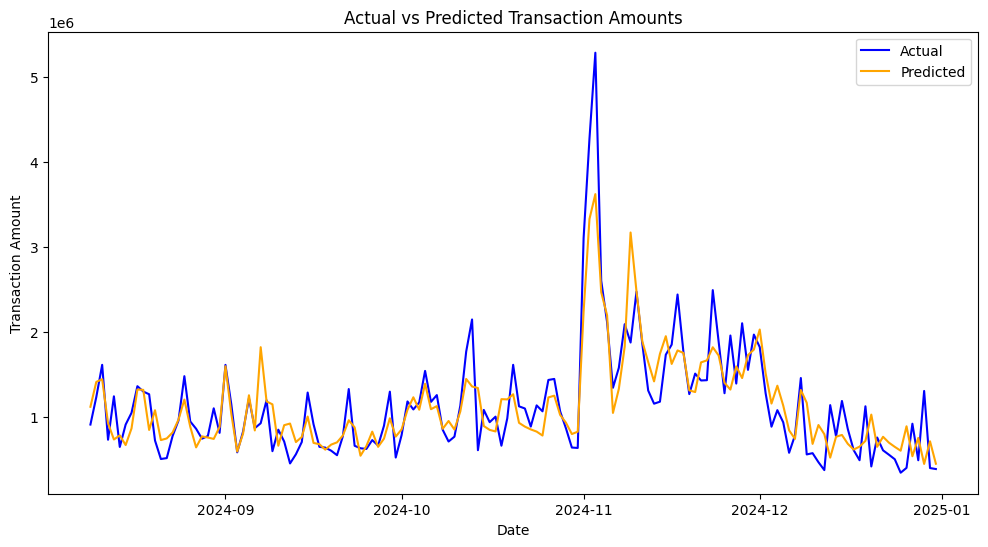

In [38]:
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt

# Example: Adding Lagged Features
# Add lagged features to the dataset to improve the model's ability to capture temporal dependencies
for lag in range(1, 8):  # Add lags for the past 7 days
	time_series_data[f'lag_{lag}'] = time_series_data['Transaction_Amount'].shift(lag)

# Drop rows with NaN values after adding lags
time_series_data = time_series_data.dropna()

# Example: Use Gradient Boosting
# Define features and target
X = time_series_data.drop(columns=['Transaction_Amount'])
y = time_series_data['Transaction_Amount']

# Split into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, shuffle=False)

# Train Gradient Boosting Regressor
model = GradientBoostingRegressor(n_estimators=100, learning_rate=0.1, max_depth=5, random_state=42)
model.fit(X_train, y_train)

# Predict
predictions = model.predict(X_test)

# Visualize Predictions
plt.figure(figsize=(12, 6))
plt.plot(y_test.index, y_test, label='Actual', color='blue')
plt.plot(y_test.index, predictions, label='Predicted', color='orange')
plt.title('Actual vs Predicted Transaction Amounts')
plt.xlabel('Date')
plt.ylabel('Transaction Amount')
plt.legend()
plt.show()


In [39]:
from sklearn.metrics import mean_squared_error, mean_absolute_error
import numpy as np

# Calculate RMSE
rmse = np.sqrt(mean_squared_error(y_test, predictions))

# Calculate MAE
mae = mean_absolute_error(y_test, predictions)

# Calculate MAPE
mape = np.mean(np.abs((y_test - predictions) / y_test)) * 100

# Print the metrics
print(f"RMSE: {rmse}")
print(f"MAE: {mae}")
print(f"MAPE: {mape}%")

RMSE: 354563.2636787371
MAE: 249439.17816262215
MAPE: 25.85177355875125%


In [11]:
import pandas as pd

import matplotlib.pyplot as plt

# Generate a date range for January 2025
january_2025_dates = pd.date_range(start="2025-01-01", end="2025-01-31", freq="D")

# Simulate exogenous variables for January 2025 (adjust as needed)
january_2025_exog = pd.DataFrame({
	"is_salary_day": [1 if day <= 8 else 0 for day in january_2025_dates.day],
	"is_holiday": [0] * len(january_2025_dates)  # Assuming no holidays in January 2025
}, index=january_2025_dates)

# Forecast for January 2025 using the model
forecast_january_2025 = model_fit.get_forecast(steps=len(january_2025_dates), exog=january_2025_exog)
forecast_index = january_2025_dates
forecast_df = pd.DataFrame(forecast_january_2025.predicted_mean, index=forecast_index, columns=['Forecast'])
forecast_df['Lower CI'] = forecast_january_2025.conf_int()['lower Transaction_Amount']
forecast_df['Upper CI'] = forecast_january_2025.conf_int()['upper Transaction_Amount']

import plotly.express as px

# Plot the forecast using Plotly Express
forecast_fig = px.line(
	forecast_df,
	x=forecast_df.index,
	y="Forecast",
	title="SARIMAX Forecast for January 2025",
	labels={"x": "Date", "Forecast": "Transaction Amount"}
)

# Add confidence intervals to the plot
forecast_fig.add_scatter(
	x=forecast_df.index,
	y=forecast_df["Lower CI"],
	mode="lines",
	line=dict(color="orange", dash="dot"),
	name="Lower Confidence Interval"
)
forecast_fig.add_scatter(
	x=forecast_df.index,
	y=forecast_df["Upper CI"],
	mode="lines",
	line=dict(color="orange", dash="dot"),
	name="Upper Confidence Interval"
)

forecast_fig.show()

c:\Users\vibhu\miniconda3\lib\site-packages\_plotly_utils\basevalidators.py:106: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



In [ ]:
import numpy as np
from pmdarima import auto_arima
from statsmodels.tsa.statespace.sarimax import SARIMAX

# ------------------------------
# Define a simple RL agent to tune SARIMAX order
# ------------------------------

class RLHyperparameterTuner:
    def __init__(self, initial_order, epsilon=0.2, learning_rate=0.1, gamma=0.9):
        """
        initial_order: list or tuple of [p, d, q]
        epsilon: exploration rate
        learning_rate: step size for Q value update
        gamma: discount factor
        """
        self.order = list(initial_order)  # current SARIMAX order [p, d, q]
        self.epsilon = epsilon
        self.lr = learning_rate
        self.gamma = gamma
        self.q_table = {}  # mapping ((state), action) -> value
        
        # Define possible actions as adjustments to [p, d, q]
        # Each action is a tuple (Δp, Δd, Δq)
        self.actions = [
            (-1,  0,  0),
            ( 1,  0,  0),
            ( 0, -1,  0),
            ( 0,  1,  0),
            ( 0,  0, -1),
            ( 0,  0,  1),
            ( 0,  0,  0)  # no change
        ]
    
    def get_q(self, state, action):
        # Return the Q-value for (state, action) or 0 if unseen
        return self.q_table.get((tuple(state), action), 0)
        
    def choose_action(self, state):
        # Epsilon-greedy: with probability epsilon choose a random action
        if np.random.rand() < self.epsilon:
            return self.actions[np.random.randint(len(self.actions))]
        else:
            # choose action with highest Q-value
            q_values = [self.get_q(state, action) for action in self.actions]
            max_value = max(q_values)
            candidate_actions = [action for action, q in zip(self.actions, q_values) if q == max_value]
            return candidate_actions[np.random.randint(len(candidate_actions))]
    
    def update_q_table(self, state, action, reward, next_state):
        # Q-learning update with max next Q-value
        max_next_q = max([self.get_q(next_state, a) for a in self.actions])
        old_value = self.get_q(state, action)
        new_value = old_value + self.lr * (reward + self.gamma * max_next_q - old_value)
        self.q_table[(tuple(state), action)] = new_value
        
    def update_order(self, order, action):
        # Adjust the current order according to the action, ensuring values remain non-negative.
        return [max(0, o + a) for o, a in zip(order, action)]


# ------------------------------
# Prepare your data and exogenous variables
# ------------------------------

# Assume time_series_data is your DataFrame that contains Transaction_Amount,
# is_salary_day, is_holiday, etc.
exog_variables = time_series_data[['is_salary_day', 'is_holiday']]

# ------------------------------
# Initialize RL agent with a starting SARIMAX order (p, d, q)
# ------------------------------

initial_order = [1, 1, 1]
agent = RLHyperparameterTuner(initial_order)

# ------------------------------
# Run a loop representing multiple episodes (each episode is a run of the model),
# and let the RL agent adjust the hyperparameters based on the reward (using AIC).
# ------------------------------

num_episodes = 10
best_model = None
best_aic = float('inf')
current_order = initial_order

for episode in range(num_episodes):
    state = current_order
    action = agent.choose_action(state)
    new_order = agent.update_order(state, action)
    
    # For simplicity we mirror the ARIMA orders into seasonal orders with weekly seasonality (period m=7)
    seasonal_order = (new_order[0], new_order[1], new_order[2], 7)
    
    print(f"Episode {episode + 1}: Trying order {tuple(new_order)}, seasonal_order {seasonal_order}")
    
    # Fit the SARIMAX model with the new parameters
    model = SARIMAX(
        time_series_data['Transaction_Amount'],
        order=tuple(new_order),
        seasonal_order=seasonal_order,
        exog=exog_variables
    )
    model_fit = model.fit(disp=False)
    
    # Use AIC as the performance metric (lower AIC means better model fit)
    aic = model_fit.aic
    reward = -aic  # reward is the negative AIC, so a lower AIC gives a higher reward
    
    print(f"Episode {episode + 1}: Model AIC = {aic}, Reward = {reward}")
    
    # Update the Q-table for the agent with the reward received
    next_state = new_order
    agent.update_q_table(state, action, reward, next_state)
    current_order = new_order  # update state for the next episode
    
    # Save the model if it is the best so far
    if aic < best_aic:
        best_aic = aic
        best_model = model_fit

print("\nBest SARIMAX Model Summary:")
print(best_model.summary())

from sklearn.metrics import mean_squared_error, mean_absolute_error
from math import sqrt

import matplotlib.pyplot as plt

# Forecast the next 30 days
forecast_steps = 30
# Ensure the exogenous variable has the correct shape
january_2025_exog_trimmed = january_2025_exog.iloc[:forecast_steps]

forecast = Sarimax_model_fit.get_forecast(steps=forecast_steps, exog=january_2025_exog_trimmed[['is_salary_day', 'is_holiday']])
forecast_index = pd.date_range(start=time_series_data.index[-1] + pd.Timedelta(days=1), periods=forecast_steps, freq='D')
forecast_df = pd.DataFrame(forecast.predicted_mean, index=forecast_index, columns=['Forecast'])
forecast_df['Lower CI'] = forecast.conf_int()['lower Transaction_Amount']
forecast_df['Upper CI'] = forecast.conf_int()['upper Transaction_Amount']

# Plot the forecast
plt.figure(figsize=(12, 6))
plt.plot(time_series_data['Transaction_Amount'], label='Actual', color='blue')
plt.plot(forecast_df['Forecast'], label='Forecast', color='orange')
plt.fill_between(forecast_df.index, forecast_df['Lower CI'], forecast_df['Upper CI'], color='orange', alpha=0.2, label='Confidence Interval')
plt.title('SARIMAX Forecast for the Next 30 Days')
plt.xlabel('Date')
plt.ylabel('Transaction Amount')
plt.legend()
plt.grid()
plt.show()

# Check accuracy of the model
# Calculate fitted values
fitted_values = Sarimax_model_fit.predict(start=0, end=len(time_series_data)-1)

# Calculate RMSE, MAE, and MAPE
rmse = sqrt(mean_squared_error(time_series_data['Transaction_Amount'], fitted_values))
mae = mean_absolute_error(time_series_data['Transaction_Amount'], fitted_values)
mape = np.mean(np.abs((time_series_data['Transaction_Amount'] - fitted_values) / time_series_data['Transaction_Amount'])) * 100



In [ ]:
import numpy as np
import pandas as pd
from statsmodels.tsa.statespace.sarimax import SARIMAX
from pmdarima import auto_arima
from sklearn.metrics import mean_squared_error

# --- Assume time_series_data is your DataFrame with columns 
#     'Transaction_Amount', 'is_salary_day', and 'is_holiday' --- #

# Partition the data into training and validation sets (preserving order)
train_size = int(len(time_series_data) * 0.8)
train_data = time_series_data.iloc[:train_size]
val_data = time_series_data.iloc[train_size:]
exog_train = train_data[['is_salary_day', 'is_holiday']]
exog_val = val_data[['is_salary_day', 'is_holiday']]

# --- Define a simple RL agent for hyperparameter tuning --- #
class RLHyperparameterTuner:
    def __init__(self, initial_order, epsilon=0.3, learning_rate=0.1, gamma=0.9):
        """
        initial_order: list or tuple of [p, d, q]
        epsilon: exploration rate
        learning_rate: step size for Q-value update
        gamma: discount factor
        """
        self.order = list(initial_order)  # current state for SARIMAX order
        self.epsilon = epsilon
        self.lr = learning_rate
        self.gamma = gamma
        self.q_table = {}  # maps (state, action) -> value
        
        # Define discrete actions: adjustments to (p, d, q)
        self.actions = [
            (-1,  0,  0),
            ( 1,  0,  0),
            ( 0, -1,  0),
            ( 0,  1,  0),
            ( 0,  0, -1),
            ( 0,  0,  1),
            ( 0,  0,  0)  # no change
        ]
    
    def get_q(self, state, action):
        # Return Q-value for (state, action) or 0 if not previously visited
        return self.q_table.get((tuple(state), action), 0)
    
    def choose_action(self, state):
        # Epsilon-greedy selection: explore or choose the best known action
        if np.random.rand() < self.epsilon:
            return self.actions[np.random.randint(len(self.actions))]
        else:
            q_values = [self.get_q(state, action) for action in self.actions]
            max_q = max(q_values)
            best_actions = [action for action, q in zip(self.actions, q_values) if q == max_q]
            return best_actions[np.random.randint(len(best_actions))]
    
    def update_q_table(self, state, action, reward, next_state):
        # Q-learning update rule
        max_next_q = max([self.get_q(next_state, a) for a in self.actions])
        old_q = self.get_q(state, action)
        new_q = old_q + self.lr * (reward + self.gamma * max_next_q - old_q)
        self.q_table[(tuple(state), action)] = new_q
        
    def update_order(self, order, action):
        # Update the order ensuring non-negative parameters
        new_order = [max(0, o + a) for o, a in zip(order, action)]
        return new_order

# Initialize the RL tuner with a starting SARIMAX order
initial_order = [1, 1, 1]
agent = RLHyperparameterTuner(initial_order)

# Variables to hold the best model performance and details
best_mse = float('inf')
best_model = None
best_model_type = None
best_order = None

# Number of episodes for the RL tuning loop
num_episodes = 20

# --- Begin the RL loop, which also benchmarks auto_arima --- #
for ep in range(num_episodes):
    # --- SARIMAX via RL-tuned hyperparameters --- #
    state = agent.order
    action = agent.choose_action(state)
    proposed_order = agent.update_order(state, action)
    # For simplicity, use the SARIMAX seasonal order as (p, d, q, m) with m=7
    seasonal_order = (proposed_order[0], proposed_order[1], proposed_order[2], 7)
    
    # Fit SARIMAX on training data with exogenous variables
    sarimax_model = SARIMAX(
        train_data['Transaction_Amount'],
        order=tuple(proposed_order),
        seasonal_order=seasonal_order,
        exog=exog_train
    )
    sarimax_fit = sarimax_model.fit(disp=False)
    
    # Forecast on the validation set using SARIMAX
    forecast_sarimax = sarimax_fit.get_forecast(steps=len(val_data), exog=exog_val).predicted_mean
    mse_sarimax = mean_squared_error(val_data['Transaction_Amount'], forecast_sarimax)
    
    # Reward is set as negative MSE so that lower error earns a higher reward
    reward = -mse_sarimax
    next_state = proposed_order
    agent.update_q_table(state, action, reward, next_state)
    
    # --- auto_arima benchmark for comparison --- #
    auto_model = auto_arima(
        train_data['Transaction_Amount'],
        exogenous=exog_train,
        seasonal=True,
        m=7,
        trace=False,
        error_action='ignore',
        suppress_warnings=True
    )
    forecast_auto = auto_model.predict(n_periods=len(val_data), exogenous=exog_val)
    mse_auto = mean_squared_error(val_data['Transaction_Amount'], forecast_auto)
    
    # --- Log performance for this episode --- #
    print(f"Episode {ep+1}:")
    print(f"  SARIMAX order: {tuple(proposed_order)}, MSE = {mse_sarimax:.4f}")
    print(f"  auto_arima MSE = {mse_auto:.4f}")
    
    # Determine the best model in the current episode
    if mse_sarimax < mse_auto:
        current_best_mse = mse_sarimax
        current_model = sarimax_fit
        current_model_type = "SARIMAX"
        current_order = proposed_order
    else:
        current_best_mse = mse_auto
        current_model = auto_model
        current_model_type = "auto_arima"
        current_order = auto_model.order if hasattr(auto_model, 'order') else None
    
    # Update the global best model if current performance is improved
    if current_best_mse < best_mse:
        best_mse = current_best_mse
        best_model = current_model
        best_model_type = current_model_type
        best_order = current_order
    
    # Update RL agent's state only if the SARIMAX model was superior in this episode
    if current_model_type == "SARIMAX":
        agent.order = proposed_order
    
    print(f"  Best model so far: {best_model_type} with MSE = {best_mse:.4f}\n")

# --- Final best model summary --- #
print("Final best model summary:")
if best_model_type == "SARIMAX":
    print(best_model.summary())
else:
    # For auto_arima, output the summary details if available
    print(best_model.summary())
